This notebook is for exploring processed data from CESM, prior to training.

In [2]:
# %%timeit -n1 -r1
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join
import pickle
import xarray as xr
%matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')

Take a look into the folders with our data

In [2]:
# ls -lh /glade/work/wchuang/mlmicrophysics/tau_run_11_nrtend/20240328_callbacks_retrain_lev/

In [2]:
ls -lh /glade/derecho/scratch/wchuang/mlmicrophysics/tau_run_11_nrtend/20240328_callbacks_retrain_lev

total 4.4G
-rw-r--r-- 1 wchuang ncar 259M Mar 28 02:34 mp_input_filtered_test.parquet
-rw-r--r-- 1 wchuang ncar 411M Mar 28 02:34 mp_input_filtered_train.parquet
-rw-r--r-- 1 wchuang ncar 208M Mar 28 02:34 mp_input_filtered_val.parquet
-rw-r--r-- 1 wchuang ncar 230M Mar 28 02:34 mp_input_nn_test.parquet
-rw-r--r-- 1 wchuang ncar 366M Mar 28 02:34 mp_input_nn_train.parquet
-rw-r--r-- 1 wchuang ncar 185M Mar 28 02:34 mp_input_nn_val.parquet
-rw-r--r-- 1 wchuang ncar 117M Mar 28 02:34 mp_meta_filtered_test.parquet
-rw-r--r-- 1 wchuang ncar 187M Mar 28 02:34 mp_meta_filtered_train.parquet
-rw-r--r-- 1 wchuang ncar  95M Mar 28 02:34 mp_meta_filtered_val.parquet
-rw-r--r-- 1 wchuang ncar 439M Mar 28 02:34 mp_meta_test.parquet
-rw-r--r-- 1 wchuang ncar 700M Mar 28 02:34 mp_meta_train.parquet
-rw-r--r-- 1 wchuang ncar 352M Mar 28 02:34 mp_meta_val.parquet
-rw-r--r-- 1 wchuang ncar  38M Mar 28 02:34 mp_output_test.parquet
-rw-r--r-- 1 wchuang ncar  59M Mar 28 02:34 mp_output_train.parquet
-rw-r

### Look at data variables in original inputs

In [3]:
ncpath = "/glade/work/wchuang/mlmicrophysics/cesm_output/tauREV4/"
ncfilename = "cam_ml_tauREV4_train.cam.h1.2005-01-01-00000.nc"
ncfile = xr.open_dataset(ncpath+ncfilename, decode_times=False)

In [4]:
ncfile.head()

<xarray.Dataset>
Dimensions:       (lat: 5, lon: 5, lev: 5, ilev: 5, trop_cld_lev: 5, time: 5,
                   nbnd: 2)
Coordinates:
  * lat           (lat) float64 -90.0 -89.06 -88.12 -87.17 -86.23
  * lon           (lon) float64 0.0 1.25 2.5 3.75 5.0
  * lev           (lev) float64 3.643 7.595 14.36 24.61 35.92
  * ilev          (ilev) float64 2.255 5.032 10.16 18.56 29.73
  * trop_cld_lev  (trop_cld_lev) float64 3.643 7.595 14.36 24.61 35.92
  * time          (time) float64 0.0 0.9583 1.917 2.875 3.833
Dimensions without coordinates: nbnd
Data variables: (12/45)
    gw            (lat) float64 ...
    hyam          (lev) float64 ...
    hybm          (lev) float64 ...
    P0            float64 ...
    hyai          (ilev) float64 ...
    hybi          (ilev) float64 ...
    ...            ...
    RHO_CLUBB     (time, lev, lat, lon) float64 ...
    T             (time, lev, lat, lon) float64 ...
    nctend_TAU    (time, trop_cld_lev, lat, lon) float64 ...
    nrtend_TAU    (time, trop_cld_lev, lat, lon) float64 ...
    qctend_TAU    (time, trop_cld_lev, lat, lon) float64 ...
    qrtend_TAU    (time, trop_cld_lev, lat, lon) float64 ...
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              cam_ml_tauREV4_train
    logname:           andrew
    host:              derecho4
    initial_file:      /glade/campaign/cesm/cesmdata/inputdata/atm/cam/inic/f...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     not_set
    time_period_freq:  hour_23

In [3]:
datapath = "/glade/derecho/scratch/wchuang/mlmicrophysics/cam_ml_tauREV4/"
data = pd.read_parquet(join(datapath, "cam_mp_data_tauREV4_000000.parquet"))

In [4]:
data.columns

Index(['lev', 'lat', 'lon', 'trop_cld_lev', 'depth', 'row', 'col', 'T',
       'RHO_CLUBB', 'CLOUD', 'FREQR', 'QC_TAU_in', 'NC_TAU_in', 'QR_TAU_in',
       'NR_TAU_in', 'QC_TAU_out', 'NC_TAU_out', 'QR_TAU_out', 'NR_TAU_out',
       'qctend_TAU', 'nctend_TAU', 'qrtend_TAU', 'nrtend_TAU', 'PGAM', 'LAMC',
       'LAMR', 'N0R', 'time'],
      dtype='object')

Read in relevant inputs and outputs

In [13]:
path = "/glade/derecho/scratch/wchuang/mlmicrophysics/tau_run_12_nrtend/20240425_add_CLD_lev_FREQR/"
mp_input_train = pd.read_parquet(join(path, "mp_input_filtered_train.parquet"))
mp_output_train = pd.read_parquet(join(path, "mp_output_train.parquet"))

print("shape of inputs", mp_input_train.shape)
print("shape of outputs", mp_output_train.shape)

mp_input = pd.concat([mp_input_train, mp_output_train], axis=1)

shape of inputs (5614421, 12)
shape of outputs (5614421, 1)


In [7]:
mp_input.head()

,lev,QC_TAU_in,QR_TAU_in,NC_TAU_in,NR_TAU_in,PGAM,LAMC,LAMR,N0R,RHO_CLUBB,CLOUD,FREQR,nrtend_TAU
18554,103.317127,0.000316,4.318351e-09,3.759287e+06,1.282869e+02,10.111000,222220.009793,45359.824635,5.819069e+06,0.186601,0.999,0.0,1.922179e+02
18555,103.317127,0.000085,8.810747e-05,6.651994e+07,4.198195e+02,2.274213,311211.746439,2464.525011,1.034656e+06,0.186601,0.999,0.0,-3.394138e-01
18568,103.317127,0.000027,1.504095e-13,3.087954e+06,1.040056e-05,9.499392,446977.728824,6011.421171,6.252217e-02,0.188257,0.999,0.0,-1.065711e-08
18590,103.317127,0.000064,7.423362e-07,5.835451e+07,5.434335e+02,2.017303,307493.356436,13199.734976,7.173178e+06,0.188774,0.999,0.0,-5.652518e-01
18591,103.317127,0.000001,2.047639e-04,1.330340e+04,2.329760e+06,10.111111,222222.222126,32940.934496,7.674448e+10,0.189260,0.999,0.0,-3.729317e+03


Do a pairwise comparision to get a sense of the correlations between variables

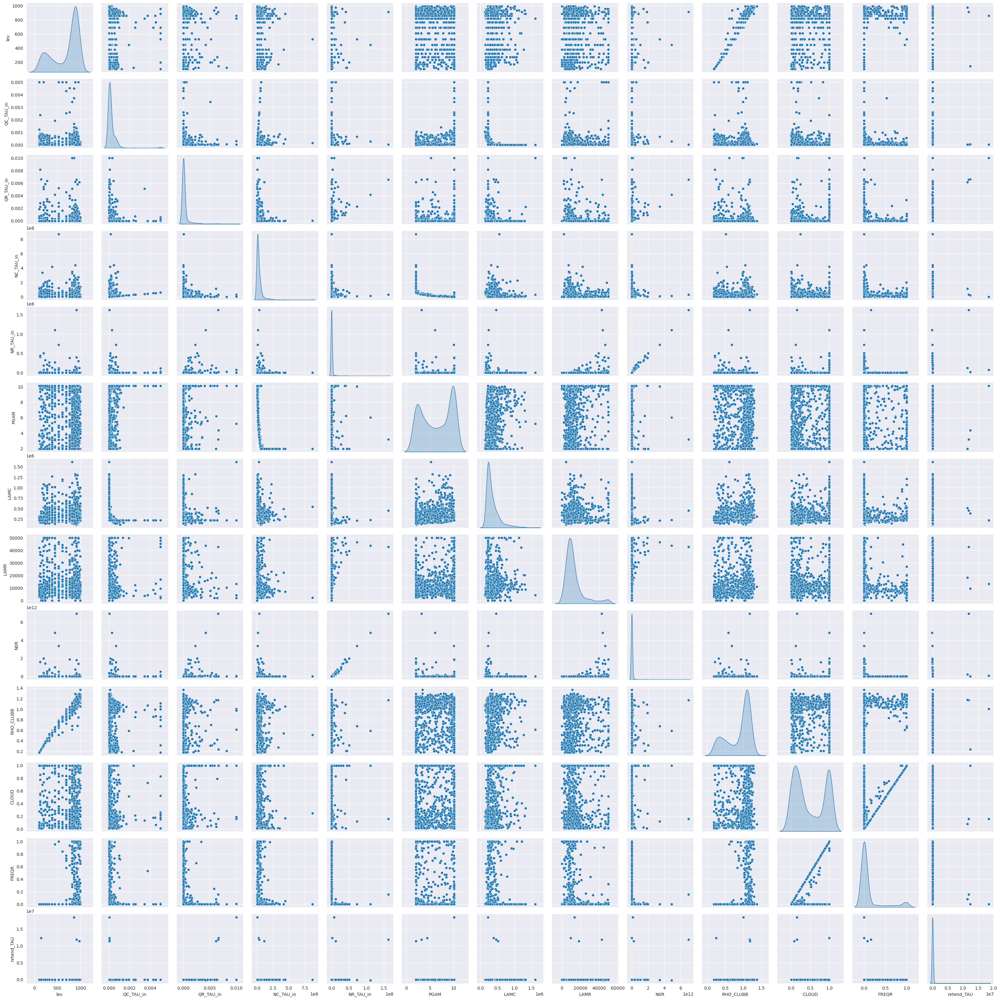

In [8]:
%%time
explore_pairplot_1 = sns.pairplot(mp_input.sample(1000, random_state=371), diag_kind="kde")
explore_pairplot_1.savefig("./figs/exploratory_pairplot_1.png")
plt.show()

Analysis: 
nrtend has some very high points, > 10<sup>7</sup>. Are these meaningful points, or should they be removed?
CLOUD correlates with FREQR along a 1:1 line for many of the points, but also has a curve toward lower FREQR, and a line at FREQR=0 for all values of CLOUD 0.0-1.0. If these are representing different types of clouds, is there a way to differentiate between them?


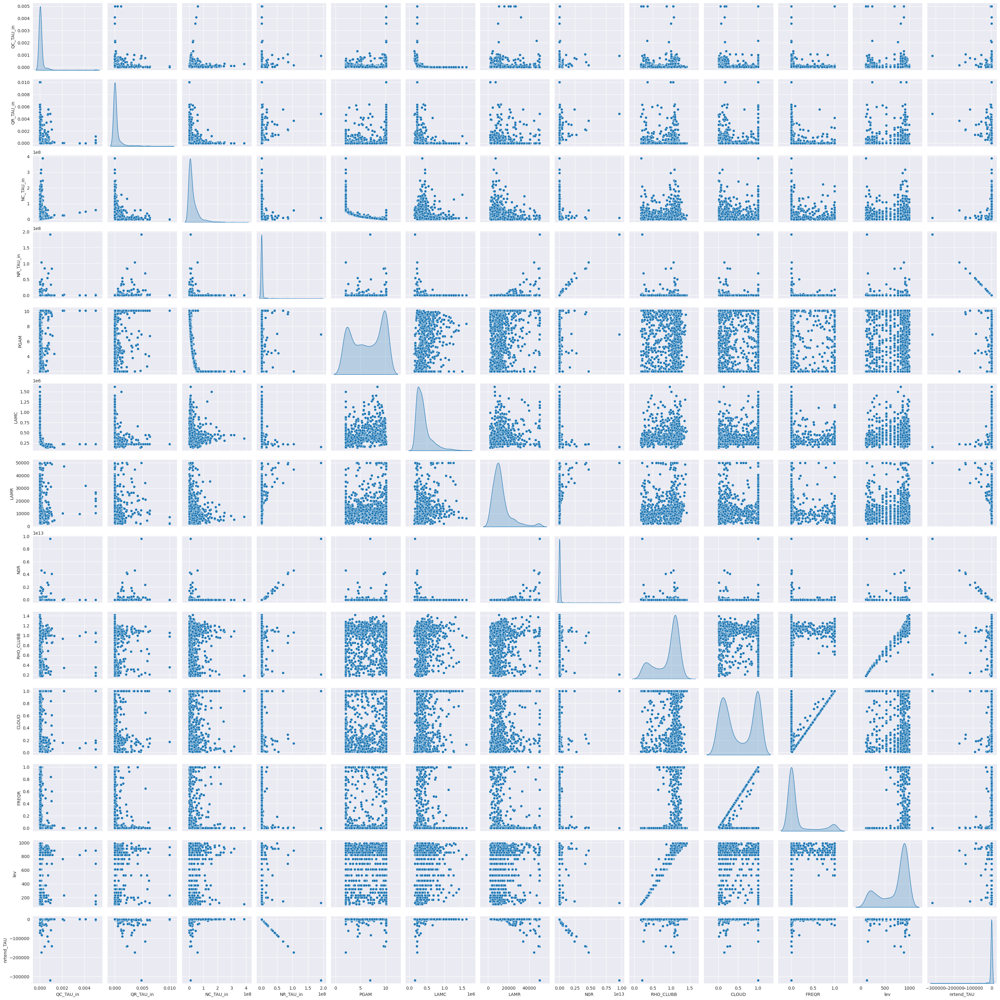

CPU times: user 1min 10s, sys: 321 ms, total: 1min 10s
Wall time: 1min 16s


In [62]:
%%time
mp_input_neg = mp_input[mp_input.nrtend_TAU<0]
explore_pairplot_4 = sns.pairplot(mp_input_neg.sample(1000, random_state=371), diag_kind="kde")
explore_pairplot_4.savefig("./figs/exploratory_pairplot_4_nctend_TAU_lt_0.png")
plt.show()

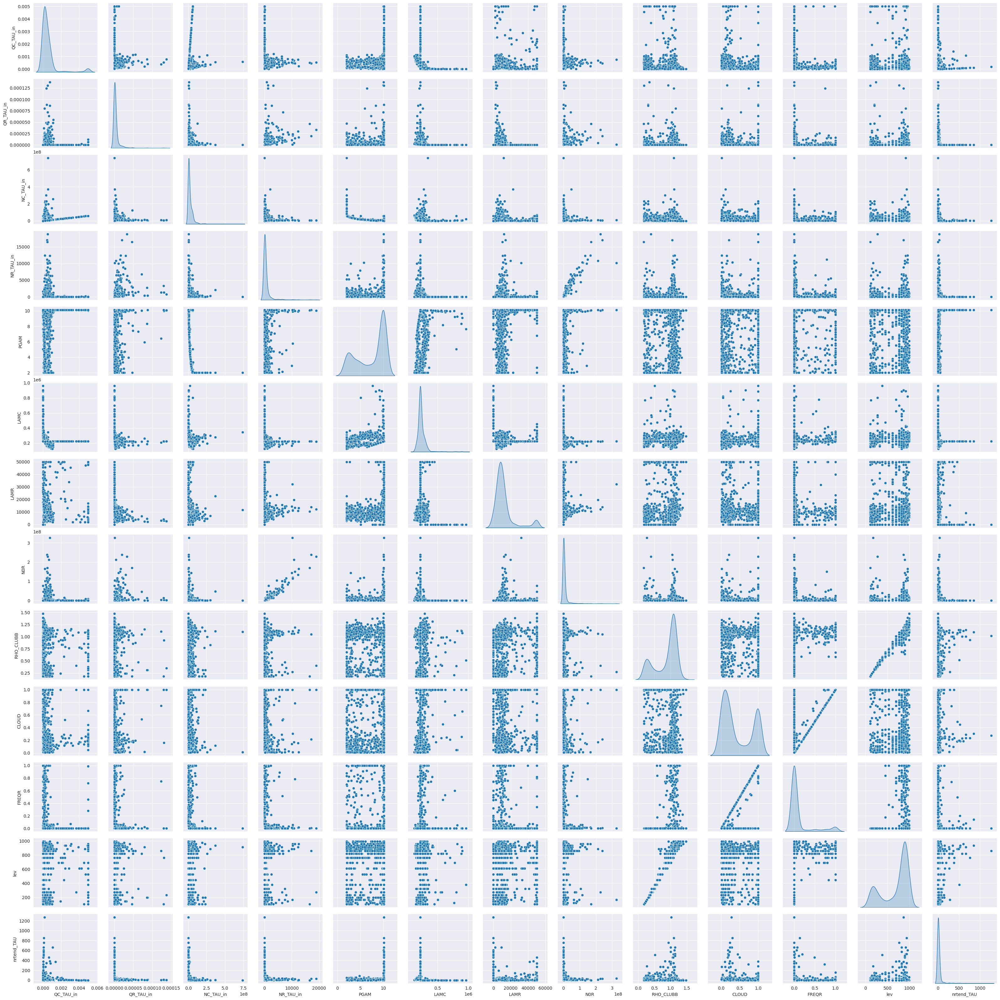

CPU times: user 1min 10s, sys: 308 ms, total: 1min 10s
Wall time: 1min 17s


In [63]:
%%time
mp_input_pos = mp_input[(mp_input.nrtend_TAU>0) & (mp_input.nrtend_TAU<1.0e5)]
explore_pairplot_5 = sns.pairplot(mp_input_pos.sample(1000, random_state=371), diag_kind="kde")
explore_pairplot_5.savefig("./figs/exploratory_pairplot_5_bw_0_1e5.png")
plt.show()

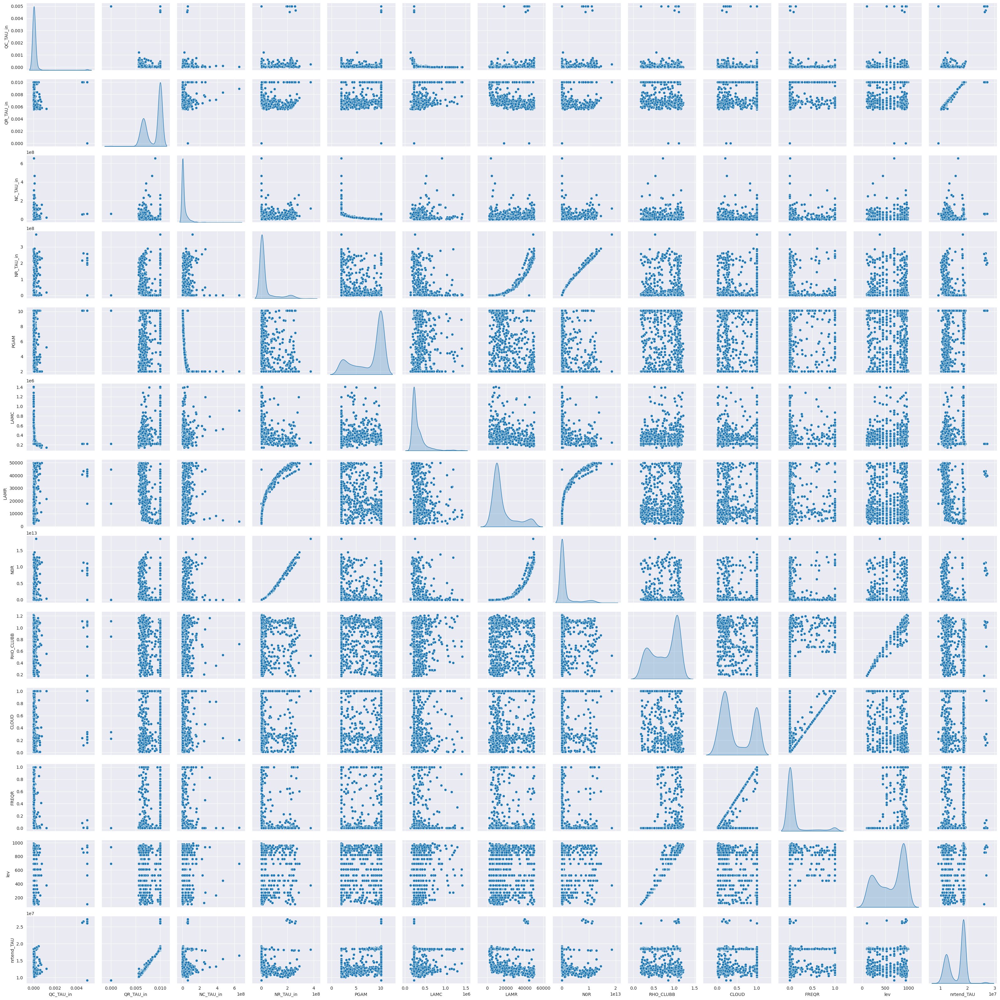

CPU times: user 43.4 s, sys: 247 ms, total: 43.6 s
Wall time: 46.3 s


In [61]:
%%time
mp_input_pos = mp_input[(mp_input.nrtend_TAU>=1.0e5)]
explore_pairplot_6 = sns.pairplot(mp_input_pos.sample(1000, random_state=371), diag_kind="kde")
explore_pairplot_6.savefig("./figs/exploratory_pairplot_6_nctend_TAU_gt_0.png")
plt.show()

In [11]:
# Filter out high nrtend points and replot
filter1 = mp_input.nrtend_TAU < 1e7
mp_input_filter1 = mp_input[filter1]

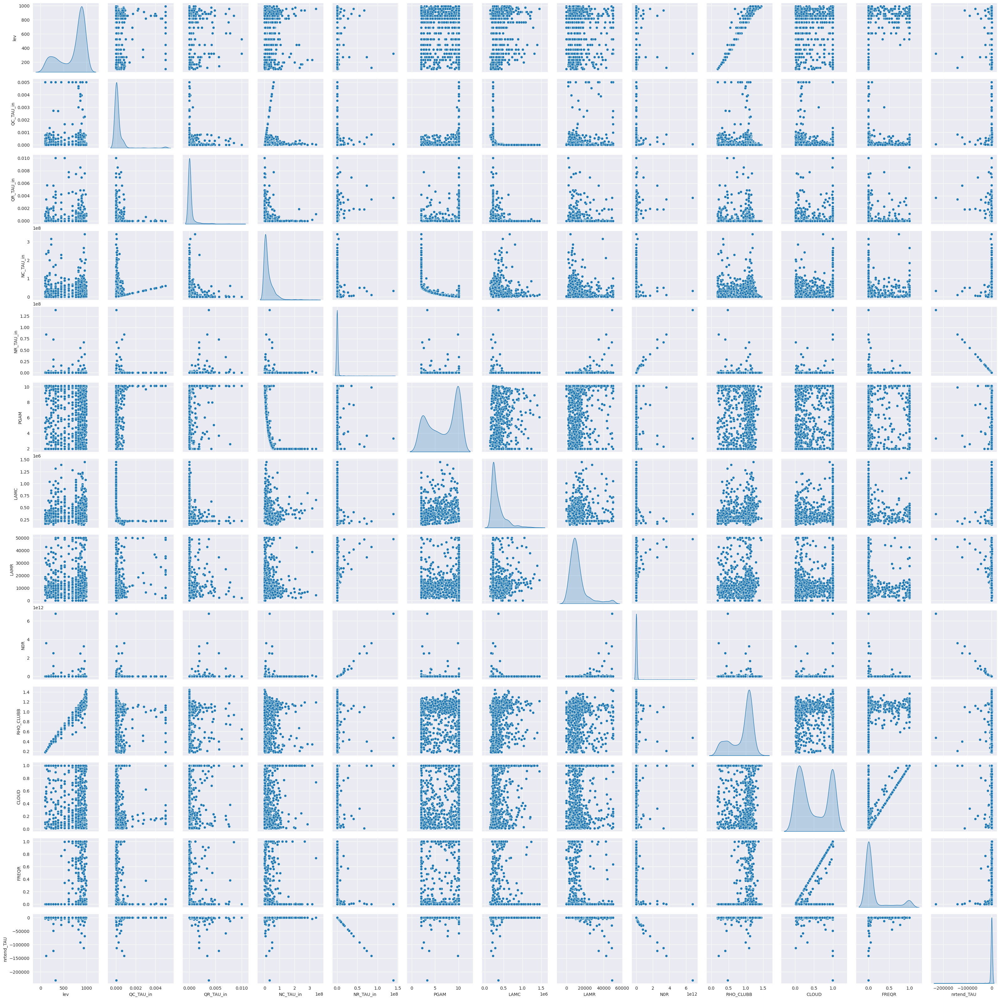

In [12]:
explore_pairplot_2 = sns.pairplot(mp_input_filter1.sample(1000, random_state=371), diag_kind="kde")
explore_pairplot_2.savefig("./figs/exploratory_pairplot_2.png")
plt.show()

In [17]:
filter2 = mp_input_filter1.N0R < 6e12
mp_input_filter2 = mp_input_filter1[filter2]

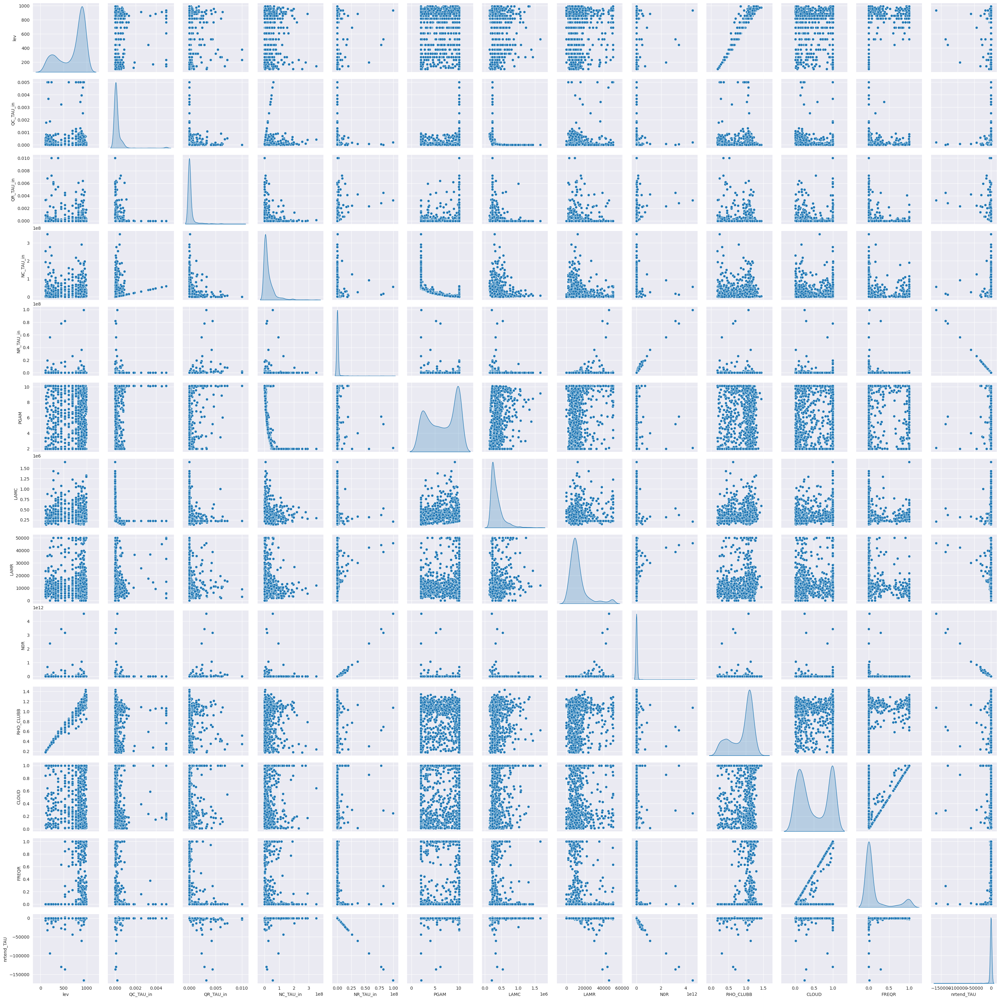

In [18]:
explore_pairplot_3 = sns.pairplot(mp_input_filter2.sample(1000, random_state=371), diag_kind="kde")
explore_pairplot_3.savefig("./figs/exploratory_pairplot_3.png")
plt.show()

### Uniform Quantile (uquant) analysis

In [2]:
path = "/glade/derecho/scratch/wchuang/mlmicrophysics/tau_run_12_nrtend/20240425_add_CLD_lev_FREQR/"
mp_uquant_input_train = pd.read_parquet(join(path, "mp_quant_input_train.parquet"))
mp_uquant_output_train = pd.read_parquet(join(path, "mp_quant_output_train.parquet"))

print("shape of inputs", mp_uquant_input_train.shape)
print("shape of outputs", mp_uquant_output_train.shape)

mp_uquant_input = pd.concat([mp_uquant_input_train, mp_uquant_output_train], axis=1)

shape of inputs (5614421, 12)
shape of outputs (5614421, 1)


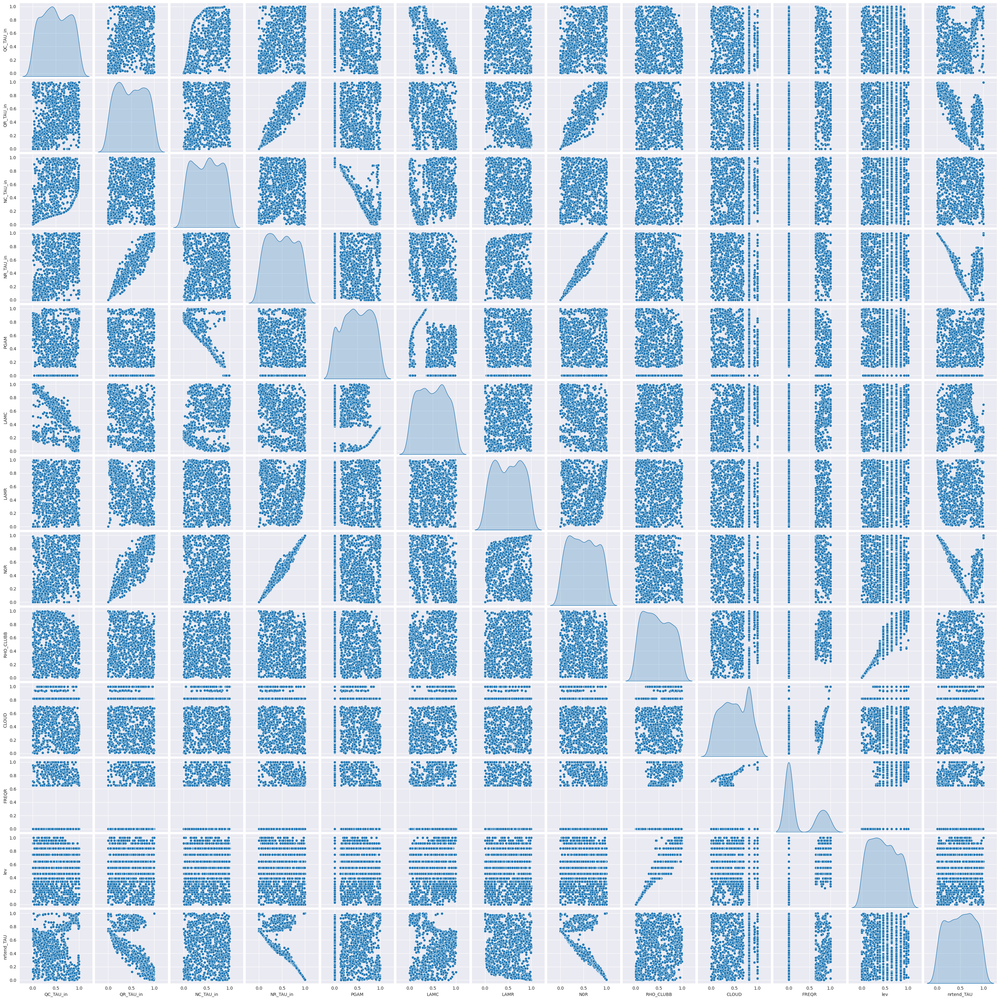

CPU times: user 37.6 s, sys: 69.8 ms, total: 37.7 s
Wall time: 41.1 s


In [9]:
%%time
# # Need to run on batch. Running out of memory
explore_pairplot_uquant_1 = sns.pairplot(mp_uquant_input.sample(1000, random_state=371), diag_kind="kde")
# explore_pairplot_uquant_1.savefig("./figs/exploratory_pairplot_uquant_1.png")
plt.show()

In [3]:
with open("/glade/work/wchuang/mlmicrophysics/tau_run_12_nrtend/20240425_add_CLD_lev_FREQR/output_quantile_transform.pkl", "rb") as out_quant_transform_file:
    output_scaler_nrtend = pickle.load(out_quant_transform_file)

In [ ]:
output_scaler_nrtend.inverse_transform(mp_uquant_input.sample(1000, random_state=371).CLOUD.reshape(-1, 1))

<Axes: >

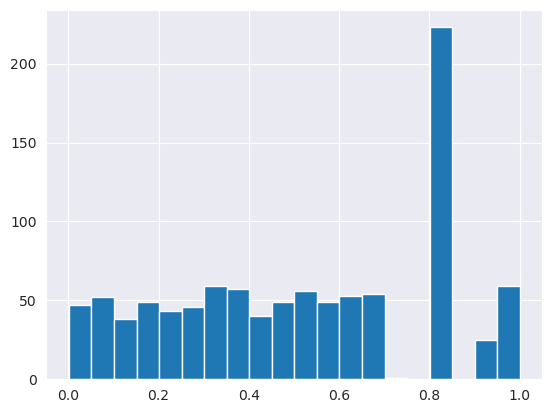

In [7]:
mp_uquant_input.sample(1000, random_state=371).CLOUD.hist(20)

In [8]:
CLOUD = mp_uquant_input.sample(1000, random_state=371).CLOUD

In [27]:
CLOUD_filter = CLOUD[(CLOUD > 0.75) & (CLOUD < 0.9)]

In [28]:
CLOUD_reshape = np.vstack(CLOUD_filter.values).reshape(-1, 1)

In [29]:
output_scaler_nrtend.inverse_transform(CLOUD_reshape[(CLOUD_reshape > 0.75) & (CLOUD_reshape < 0.9)])

/glade/u/home/wchuang/.local/lib/python3.9/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but QuantileTransformer was fitted with feature names
  warnings.warn(


ValueError: Expected 2D array, got 1D array instead:
array=[0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925 0.81887925
 0.81887925].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [57]:
nrtend_0 = mp_input.nrtend_TAU[mp_input.nrtend_TAU<0]
nrtend_1 = mp_input.nrtend_TAU[(mp_input.nrtend_TAU>0) & (mp_input.nrtend_TAU<1.0e5)]
nrtend_2 = mp_input.nrtend_TAU[(mp_input.nrtend_TAU>=1.0e5)]

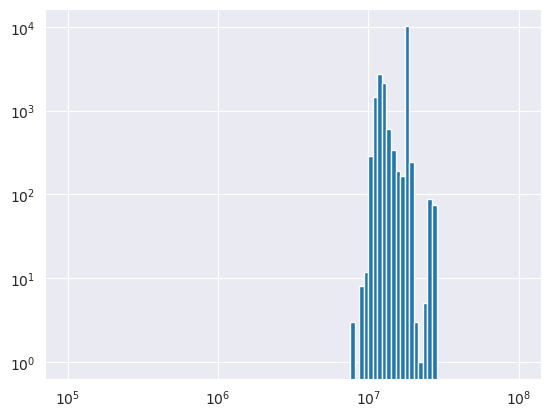

In [58]:
logbins = np.logspace(5, 8, 100)
plt.hist(nrtend_2, bins=logbins)
plt.xscale('log')
plt.yscale('log')
plt.show()

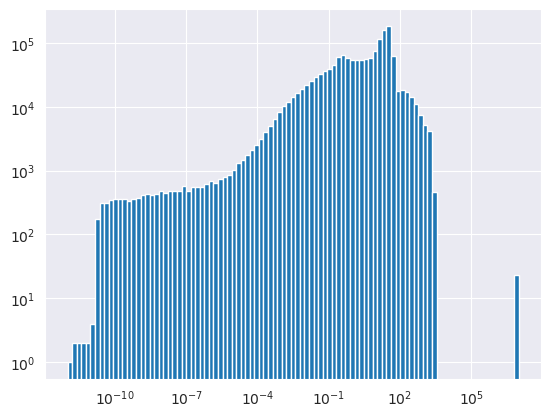

In [55]:
logbins = np.logspace(-12, 7, 100)
plt.hist(nrtend_1, bins=logbins)
plt.xscale('log')
plt.yscale('log')
plt.show()

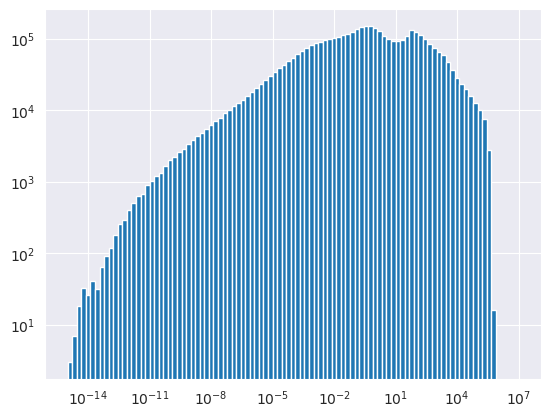

In [64]:
logbins = np.logspace(-15, 7, 100)
plt.hist(-nrtend_0, bins=logbins)
plt.xscale('log')
plt.yscale('log')
plt.show()

In [65]:
nrtend_0.min()

-651839.975057517

In [10]:
mp_meta_train = pd.read_parquet(join(path, "mp_meta_filtered_train.parquet"))

In [11]:
mp_meta_train.columns

Index(['lat', 'lon', 'lev', 'depth', 'row', 'col', 'T', 'time', 'qrtend_TAU',
       'nrtend_TAU', 'nctend_TAU'],
      dtype='object')

#### Look at original data for other potential variables
geopotential height

In [4]:
geo_df = pd.read_parquet("/glade/derecho/scratch/wchuang/mlmicrophysics/cam_ml_tauREV4/cam_mp_data_tauREV4_005865.parquet")

In [5]:
geo_df["trop_cld_lev"].unique()

array([976.32540739, 992.55609512, 957.48547954, 912.64454694,
       936.19839847, 887.02024892, 763.40448111, 820.85836865,
       691.38943031, 859.53476653, 609.77869481, 524.68717471,
       322.24190235, 379.10090387, 445.9925741 , 273.91081676,
       232.82861896, 197.9080867 , 168.22507977, 121.54724076,
       142.99403876, 103.31712663,  87.82123029,  73.75095785])

Look at data distribution across latitude

In [6]:
path = "/glade/derecho/scratch/wchuang/mlmicrophysics/tau_run_11_nrtend/20240328_callbacks_retrain_lev"
mp_filtered_input = pd.read_parquet(join(path, "mp_input_filtered_val.parquet"))
mp_input = pd.read_parquet(join(path, "mp_quant_input_val.parquet"))
mp_meta = pd.read_parquet(join(path, "mp_meta_val.parquet"))
mp_output = pd.read_parquet(join(path, "mp_output_val.parquet"))

In [7]:
mod_path = "/glade/work/wchuang/mlmicrophysics/tau_run_11_nrtend/20240328_callbacks_retrain_lev"
with open(join(mod_path, "input_quantile_transform.pkl"), "rb") as qt_file:
    input_transformer = pickle.load(qt_file)

In [8]:
mp_filtered_input

,lev,QC_TAU_in,QR_TAU_in,NC_TAU_in,NR_TAU_in,PGAM,LAMC,LAMR,N0R,RHO_CLUBB,CLOUD,FREQR
12442,103.317127,0.000056,1.924425e-03,5.316708e+07,210438.896241,3.433666,425911.401319,7003.658532,1.473842e+09,0.190202,0.265262,0.000000
12462,103.317127,0.005000,1.430869e-07,5.939541e+07,10.588310,10.111111,222222.222163,6148.825758,6.510567e+04,0.188984,0.625754,0.000000
12463,103.317127,0.000032,9.443742e-08,3.876830e+07,4.911415,3.248664,446461.283944,5466.853860,2.684999e+04,0.189092,0.352557,0.000000
12483,103.317127,0.000076,2.001625e-04,3.896377e+07,36277.292069,3.177440,330002.545402,8288.336057,3.006784e+08,0.188861,0.091371,0.000000
12486,103.317127,0.000005,8.127747e-07,5.709197e+04,27.377783,10.111111,222222.222134,4729.980280,1.294964e+05,0.188329,0.999000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
10917917,992.556095,0.000112,5.134406e-07,6.008034e+06,418.979186,7.635817,291948.371366,13686.236688,5.734248e+06,1.311698,0.046461,0.046461
10917918,992.556095,0.000083,6.945415e-07,7.592352e+06,408.942477,7.093153,329371.714060,12275.465222,5.019959e+06,1.311699,0.046442,0.046442
10917919,992.556095,0.000035,2.003179e-06,9.840658e+06,1047.512500,6.420455,443801.106916,11799.485611,1.236011e+07,1.311699,0.046442,0.046442
10917920,992.556095,0.000112,5.129522e-07,6.007067e+06,418.533311,7.636136,291964.906696,13685.720422,5.727930e+06,1.311699,0.046442,0.046442


In [9]:
mp_filtered_input["QC_TAU_in"].describe()

count    2.564742e+06
mean     2.394681e-04
std      6.391045e-04
min      1.000001e-06
25%      2.014598e-05
50%      6.841307e-05
75%      1.704849e-04
max      5.000000e-03
Name: QC_TAU_in, dtype: float64

In [16]:
def plot_loghist(x, bins):
  hist, bins = np.histogram(x, bins=bins)
  logbins = np.logspace(np.log10(bins[0]),np.log10(bins[1]),len(bins))
  plt.hist(x, bins=logbins)
  plt.xscale('log')

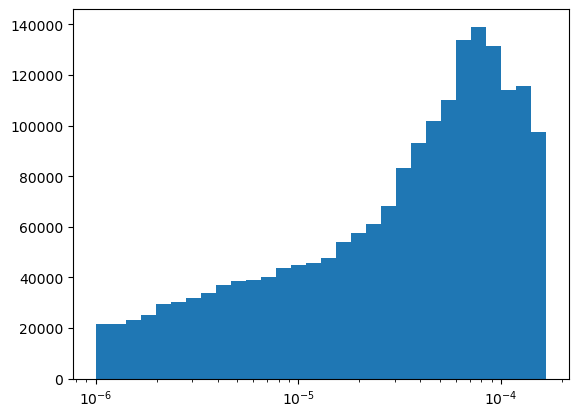

In [24]:
plot_loghist(mp_filtered_input["QC_TAU_in"], 30)

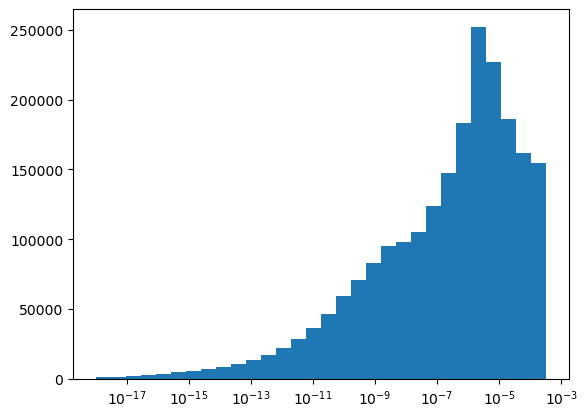

In [25]:
plot_loghist(mp_filtered_input[mp_filtered_input["QR_TAU_in"]>0]["QR_TAU_in"], 30)

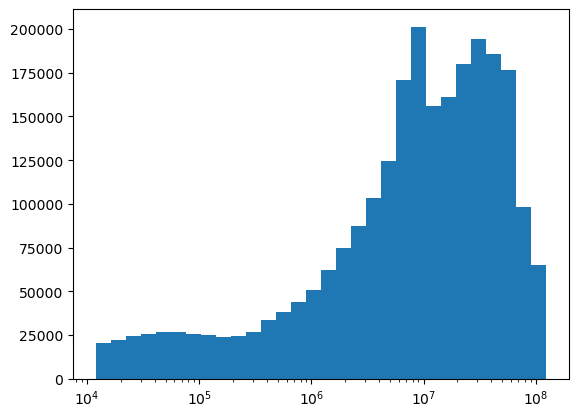

In [33]:
plot_loghist(mp_filtered_input["NC_TAU_in"], 30)

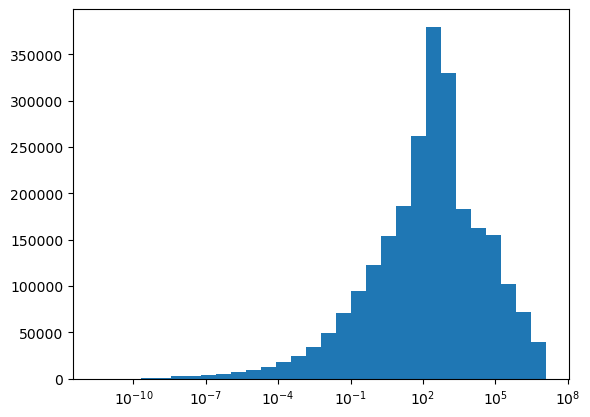

In [35]:
plot_loghist(mp_filtered_input[mp_filtered_input["NR_TAU_in"]>0]["NR_TAU_in"], 30)

In [30]:
mp_filtered_input["PGAM"].describe()

count    2.564742e+06
mean     6.615614e+00
std      3.137576e+00
min      2.000000e+00
25%      3.439299e+00
50%      7.134919e+00
75%      1.000129e+01
max      1.011111e+01
Name: PGAM, dtype: float64

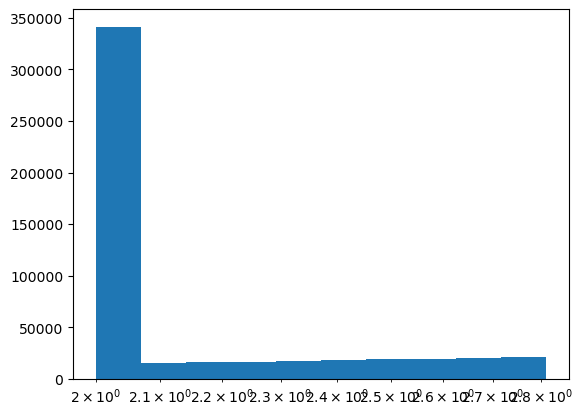

In [29]:
plot_loghist(mp_filtered_input["PGAM"], 10)

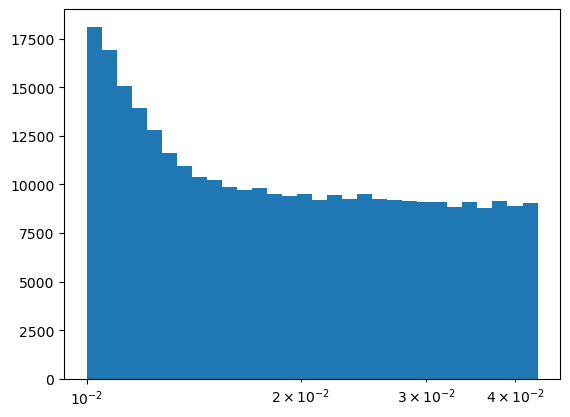

In [32]:
plot_loghist(mp_filtered_input["CLOUD"], 30)

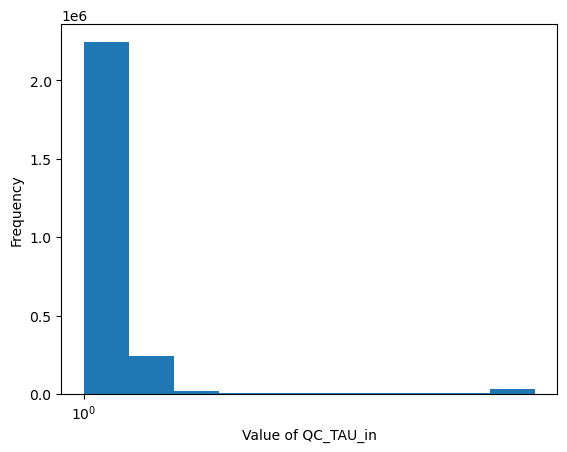

In [12]:
# Checking out whether the variables are uniformly distributed or normally distributed
# on the log scale.
# This is to determine whether we need to use uniform or normal quantile transformations.
mp_filtered_input["QC_TAU_in"]
import numpy as np
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1)
ax.hist(mp_filtered_input["QC_TAU_in"])
ax.set_ylabel("Frequency")
ax.set_xlabel("Value of QC_TAU_in")
ax.xaxis.set_major_locator(plt.FixedLocator([-2, -1, 0]))
ticks = ["$10^{{ {} }}$".format(i) for i in [-2, -1, 0]]
ax.set_xticklabels(ticks)
plt.show()

In [9]:
mp_output.describe()

,nrtend_TAU
count,2.564742e+06
mean,5.143882e+04
std,9.347812e+05
min,-5.289285e+05
25%,-4.043696e+00
50%,-1.538245e-02
75%,1.230468e-02
max,2.735987e+07


In [10]:
!ls /glade/derecho/scratch/wchuang/mlmicrophysics/cam_ml_tauREV4/

cam_mp_data_tauREV4_000000.parquet  cam_mp_data_tauREV4_008763.parquet
cam_mp_data_tauREV4_000023.parquet  cam_mp_data_tauREV4_008786.parquet
cam_mp_data_tauREV4_000046.parquet  cam_mp_data_tauREV4_008809.parquet
cam_mp_data_tauREV4_000069.parquet  cam_mp_data_tauREV4_008832.parquet
cam_mp_data_tauREV4_000092.parquet  cam_mp_data_tauREV4_008855.parquet
cam_mp_data_tauREV4_000115.parquet  cam_mp_data_tauREV4_008878.parquet
cam_mp_data_tauREV4_000138.parquet  cam_mp_data_tauREV4_008901.parquet
cam_mp_data_tauREV4_000161.parquet  cam_mp_data_tauREV4_008924.parquet
cam_mp_data_tauREV4_000184.parquet  cam_mp_data_tauREV4_008947.parquet
cam_mp_data_tauREV4_000207.parquet  cam_mp_data_tauREV4_008970.parquet
cam_mp_data_tauREV4_000230.parquet  cam_mp_data_tauREV4_008993.parquet
cam_mp_data_tauREV4_000253.parquet  cam_mp_data_tauREV4_009016.parquet
cam_mp_data_tauREV4_000276.parquet  cam_mp_data_tauREV4_009039.parquet
cam_mp_data_tauREV4_000299.parquet  cam_mp_data_tauREV4_009062.parquet
cam_mp

In [29]:
from pathlib import Path
data_dir = Path('/glade/derecho/scratch/wchuang/mlmicrophysics/cam_ml_tauREV4/')
full_df = pd.concat(
    pd.read_parquet(parquet_file)
    for parquet_file in data_dir.glob('*0008*.parquet')
)
full_df.head()

,lev,lat,lon,trop_cld_lev,depth,row,col,T,RHO_CLUBB,CLOUD,...,NR_TAU_out,qctend_TAU,nctend_TAU,qrtend_TAU,nrtend_TAU,PGAM,LAMC,LAMR,N0R,time
0,3.643466,-84.34555,242.50,957.485480,0,6,194,263.376377,0.004576,0.0,...,0.000005,0.000000e+00,-10.806246,0.000000e+00,-5.438243e-08,5.690504,550966.868141,19851.952628,0.753214,33.541667
1,3.643466,-84.34555,243.75,936.198398,0,6,195,263.373599,0.004576,0.0,...,0.000271,0.000000e+00,-6.114725,0.000000e+00,-2.217399e-05,6.565880,602359.966648,49986.385229,678.572002,33.541667
2,3.643466,-84.34555,243.75,957.485480,0,6,195,263.373599,0.004576,0.0,...,0.000057,0.000000e+00,-29.496872,0.000000e+00,-2.906446e-06,6.004090,480819.552250,27447.699615,49.419071,33.541667
3,3.643466,-84.34555,243.75,976.325407,0,6,195,263.373599,0.004576,0.0,...,0.001364,0.000000e+00,-0.290186,0.000000e+00,-9.051782e-06,5.341680,860752.442776,26256.950903,178.409736,33.541667
4,3.643466,-84.34555,245.00,936.198398,0,6,196,263.371474,0.004576,0.0,...,10.339810,-1.357466e-12,-8.110004,1.357466e-12,1.723302e-02,7.143227,574120.604416,0.000000,0.000000,33.541667


In [30]:
full_df["nrtend_TAU"].describe()

count    4.592522e+07
mean     2.755849e+06
std      6.564867e+06
min     -6.631456e+05
25%     -4.127622e+00
50%     -1.364249e-03
75%      1.346822e+01
max      5.424478e+08
Name: nrtend_TAU, dtype: float64

In [14]:
mp_meta

,lat,lon,lev,depth,row,col,T,time,qrtend_TAU,nrtend_TAU,nctend_TAU
0,-89.057592,175.00,3.643466,0,1,140,265.560397,0.000,0.000000e+00,-1.186641e-05,-11.734052
1,-89.057592,196.25,3.643466,0,1,157,265.750479,0.000,0.000000e+00,-1.759522e-06,-6.638802
2,-89.057592,227.50,3.643466,0,1,182,265.742430,0.000,0.000000e+00,-1.400493e-08,-0.827996
3,-88.115183,168.75,3.643466,0,2,135,265.948429,0.000,2.567907e-36,-3.438607e-11,-0.050795
4,-88.115183,188.75,3.643466,0,2,151,266.222055,0.000,0.000000e+00,-6.599024e-05,-49.196158
...,...,...,...,...,...,...,...,...,...,...,...
10917917,90.000000,145.00,992.556095,31,191,116,268.922784,520.375,3.528739e-09,9.621380e-01,-769.643645
10917918,90.000000,215.00,992.556095,31,191,172,268.922677,520.375,1.453419e-09,-7.135761e-02,-415.083027
10917919,90.000000,228.75,992.556095,31,191,183,268.922677,520.375,1.066292e-09,-1.041122e+00,-345.241951
10917920,90.000000,350.00,992.556095,31,191,280,268.922679,520.375,3.523917e-09,9.607843e-01,-769.124390


(array([ 1024.,  3514., 25975., 63547., 60693., 50550., 40095., 14287.,
         5592.,  2996.]),
 array([-89.05759162, -71.2460733 , -53.43455497, -35.62303665,
        -17.81151832,   0.        ,  17.81151832,  35.62303665,
         53.43455497,  71.2460733 ,  89.05759162]),
 <BarContainer object of 10 artists>)

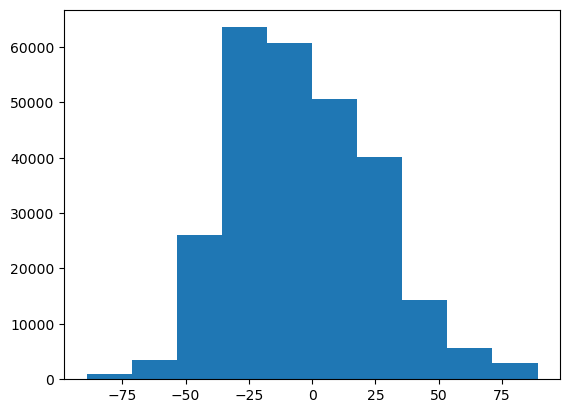

In [8]:
plt.hist(mp_meta["lat"][mp_meta["nctend_TAU"] == 0])

In [ ]:
plt.hist2d(mp_input["QC_TAU_in"], np.log10(np.maximum(mp_meta["qrtend_TAU"], 1e-30)), cmin=1, bins=20)

(array([ 81080.,  50820.,  42906.,  22493.,  19771.,  15119.,  14273.,
         15165.,  16029., 204371.]),
 array([0.01000014, 0.10900013, 0.20800011, 0.3070001 , 0.40600009,
        0.50500007, 0.60400006, 0.70300004, 0.80200003, 0.90100001,
        1.        ]),
 <BarContainer object of 10 artists>)

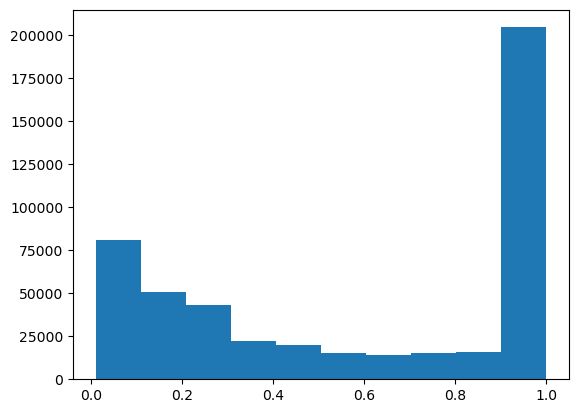

In [16]:
plt.hist(mp_filtered_input["CLOUD"][mp_meta["qrtend_TAU"] == 0])

In [13]:
mp_input.columns

Index(['QC_TAU_in', 'QR_TAU_in', 'NC_TAU_in', 'NR_TAU_in', 'PGAM', 'LAMC',
       'LAMR', 'N0R', 'RHO_CLUBB'],
      dtype='object')

In [14]:
mp_input_raw = input_transformer.inverse_transform(mp_input)

In [14]:
mp_filtered_input

,QC_TAU_in,QR_TAU_in,NC_TAU_in,NR_TAU_in,PGAM,LAMC,LAMR,N0R,RHO_CLUBB,CLOUD,FREQR
11065,0.000028,1.000000e-02,2.287428e+08,7.255702e+05,2.000000,638717.806578,6108.619901,4.432233e+09,0.163856,0.965821,0.000000
11081,0.000012,8.775304e-05,1.702891e+06,2.556017e+04,9.710675,492632.269817,9708.462341,2.481499e+08,0.166399,0.999000,0.000000
11092,0.005000,7.185435e-11,5.939541e+07,2.042728e+00,10.111111,222222.222176,44699.479647,9.130889e+04,0.161430,0.016684,0.000000
11112,0.000013,1.000000e-02,2.686956e+07,9.281961e+07,5.048341,720031.291603,30779.616077,2.856952e+12,0.163821,0.999000,0.000000
11128,0.000009,4.936988e-08,2.819910e+06,1.790299e+01,9.073156,605398.244138,10444.101494,1.869806e+05,0.160894,0.030584,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
10917917,0.000112,5.134179e-07,6.008011e+06,4.189578e+02,7.635824,291949.217359,13686.205526,5.733943e+06,1.311698,0.046459,0.046459
10917918,0.000083,6.945394e-07,7.592347e+06,4.089410e+02,7.093155,329371.770689,12275.462960,5.019940e+06,1.311699,0.046442,0.046442
10917919,0.000083,6.945192e-07,7.592297e+06,4.089269e+02,7.093170,329372.329031,12275.441307,5.019758e+06,1.311699,0.046441,0.046441
10917920,0.000035,2.003186e-06,9.840676e+06,1.047516e+03,6.420450,443800.934019,11799.485979,1.236015e+07,1.311699,0.046442,0.046442


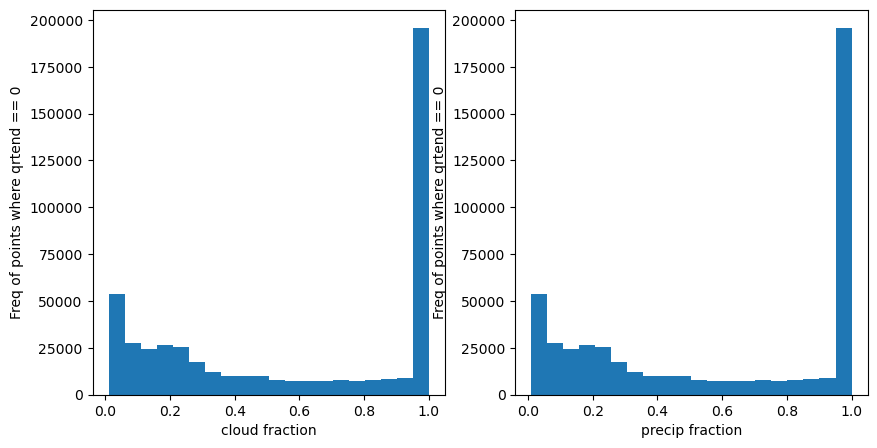

In [17]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(mp_filtered_input["CLOUD"][mp_meta["qrtend_TAU"] == 0], bins=20)
plt.xlabel("cloud fraction")
plt.ylabel("Freq of points where qrtend == 0")
plt.subplot(1, 2, 2)
plt.hist(mp_filtered_input["CLOUD"][mp_meta["qrtend_TAU"] == 0], bins=20)
plt.xlabel("precip fraction")
plt.ylabel("Freq of points where qrtend == 0")
plt.savefig("cloud_frac_zero_tend_20240320_callbacks_retrain.png", dpi=300, bbox_inches="tight")

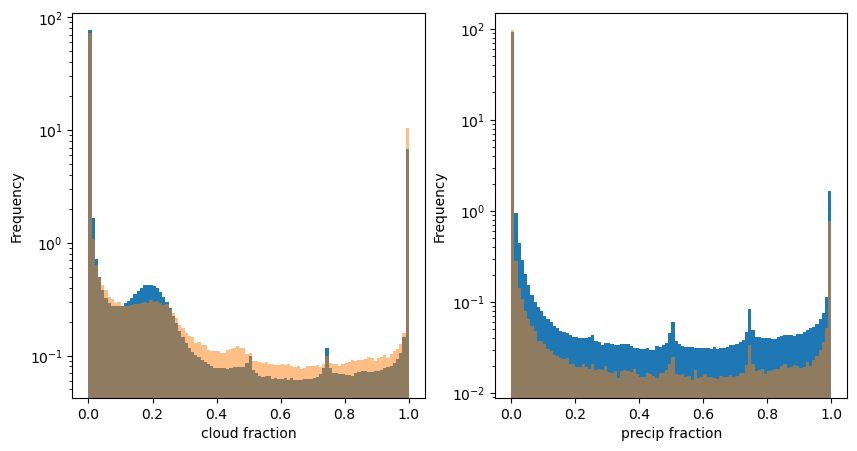

In [115]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(mp_input_raw[:, -2][mp_meta["qrtend_TAU"] > 0], bins=np.arange(0, 1.01, 0.01), density=True)
plt.hist(mp_input_raw[:, -2][mp_meta["qrtend_TAU"] == 0], 
         bins=np.arange(0, 1.01, 0.01), 
         density=True, alpha=0.5)
plt.gca().set_yscale("log")

plt.xlabel("cloud fraction")
plt.ylabel("Frequency")
plt.subplot(1, 2, 2)
plt.hist(mp_input_raw[:, -1][mp_meta["qrtend_TAU"] > 0], bins=np.arange(0, 1.01, 0.01), density=True)

plt.hist(mp_input_raw[:, -1][mp_meta["qrtend_TAU"] == 0], bins=np.arange(0, 1.01, 0.01), 
         density=True, alpha=0.5)
plt.gca().set_yscale("log")
plt.xlabel("precip fraction")
plt.ylabel("Frequency")
plt.savefig("cloud_frac_zero_tend.png", dpi=300, bbox_inches="tight")

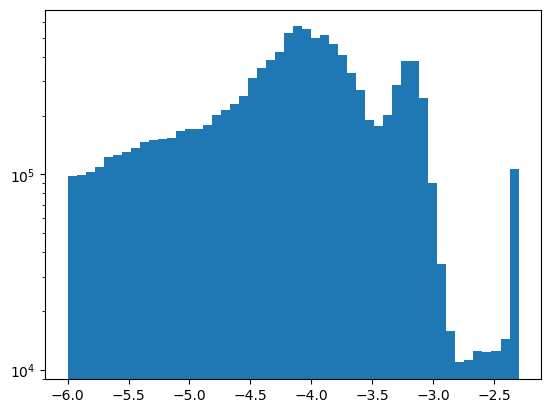

In [152]:
plt.hist(np.log10(mp_input_raw[:, 0]), bins=50)
plt.gca().set_yscale("log")

In [154]:
np.log10(mp_input_raw[:, 0]).max()

-2.3010299956639813

(array([285940., 285078., 285747., 285377., 286236., 285931., 285025.,
        284647., 285479., 285566., 286003., 285804., 286191., 285043.,
        284922., 285533., 285418., 285301., 285459., 284878., 285152.,
        284026., 285320., 284994., 284532., 284965., 285697., 285760.,
        284706., 285204., 285550., 285028.,      0.,      0.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
        26., 27., 28., 29., 30., 31., 32., 33., 34.]),
 <BarContainer object of 34 artists>)

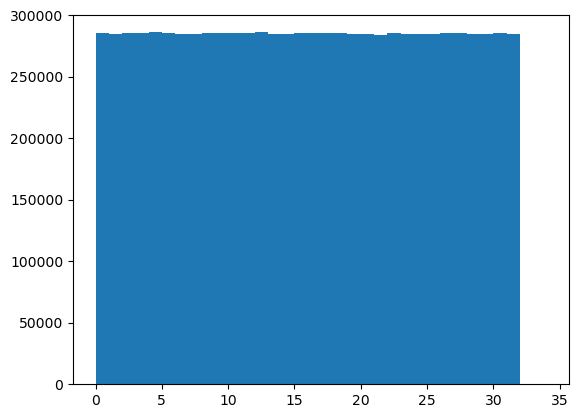

In [54]:
plt.hist(mp_meta["depth"][mp_meta["qrtend_TAU"] > 0], bins=np.arange(0, 35));

In [58]:
np.count_nonzero(mp_meta["qrtend_TAU"] == 0) / mp_meta["qrtend_TAU"].shape[0]

0.16371338795056423

In [64]:
mp_input_raw[:, 3].max()

221229248.39886552

In [132]:
ls /glade/derecho/scratch/andrew/archive/cam_ml_tauREV4_train/atm/hist/

cam_ml_tauREV4_train.cam.h0.2005-01.nc
cam_ml_tauREV4_train.cam.h0.2005-02.nc
cam_ml_tauREV4_train.cam.h0.2005-03.nc
cam_ml_tauREV4_train.cam.h0.2005-04.nc
cam_ml_tauREV4_train.cam.h0.2005-05.nc
cam_ml_tauREV4_train.cam.h0.2005-06.nc
cam_ml_tauREV4_train.cam.h0.2005-07.nc
cam_ml_tauREV4_train.cam.h0.2005-08.nc
cam_ml_tauREV4_train.cam.h0.2005-09.nc
cam_ml_tauREV4_train.cam.h0.2005-10.nc
cam_ml_tauREV4_train.cam.h0.2005-11.nc
cam_ml_tauREV4_train.cam.h0.2005-12.nc
cam_ml_tauREV4_train.cam.h0.2006-01.nc
cam_ml_tauREV4_train.cam.h0.2006-02.nc
cam_ml_tauREV4_train.cam.h0.2006-03.nc
cam_ml_tauREV4_train.cam.h0.2006-04.nc
cam_ml_tauREV4_train.cam.h0.2006-05.nc
cam_ml_tauREV4_train.cam.h0.2006-06.nc
cam_ml_tauREV4_train.cam.h0.2006-07.nc
cam_ml_tauREV4_train.cam.h0.2006-08.nc
cam_ml_tauREV4_train.cam.h0.2006-09.nc
cam_ml_tauREV4_train.cam.h0.2006-10.nc
cam_ml_tauREV4_train.cam.h0.2006-11.nc
cam_ml_tauREV4_train.cam.h0.2006-12.nc
cam_ml_tauREV4_train.cam.h1.2005-01-01-00000.nc
cam_ml_tauREV4_t

In [3]:
ds = xr.open_dataset("/glade/derecho/scratch/andrew/archive/cam_ml_tauREV4_train/atm/hist/cam_ml_tauREV4_train.cam.h1.2005-04-03-00000.nc")

In [6]:
ds0 = xr.open_dataset("/glade/derecho/scratch/andrew/archive/cam_ml_tauREV4_train/atm/hist/cam_ml_tauREV4_train.cam.h0.2005-01.nc")

In [8]:
ds0

<xarray.Dataset>
Dimensions:           (lat: 192, lon: 288, lev: 32, ilev: 33, trop_cld_lev: 32,
                       time: 1, nbnd: 2)
Coordinates:
  * lat               (lat) float64 -90.0 -89.06 -88.12 ... 88.12 89.06 90.0
  * lon               (lon) float64 0.0 1.25 2.5 3.75 ... 356.2 357.5 358.8
  * lev               (lev) float64 3.643 7.595 14.36 ... 957.5 976.3 992.6
  * ilev              (ilev) float64 2.255 5.032 10.16 ... 967.5 985.1 1e+03
  * trop_cld_lev      (trop_cld_lev) float64 3.643 7.595 14.36 ... 976.3 992.6
  * time              (time) object 2005-02-01 00:00:00
Dimensions without coordinates: nbnd
Data variables: (12/589)
    gw                (lat) float64 ...
    hyam              (lev) float64 ...
    hybm              (lev) float64 ...
    P0                float64 ...
    hyai              (ilev) float64 ...
    hybi              (ilev) float64 ...
    ...                ...
    RTP2_CLUBB        (time, ilev, lat, lon) float64 ...
    THLP2_CLUBB       (time, ilev, lat, lon) float64 ...
    RTPTHLP_CLUBB     (time, ilev, lat, lon) float64 ...
    WPRCP_CLUBB       (time, ilev, lat, lon) float64 ...
    WPTHVP_CLUBB      (time, ilev, lat, lon) float64 ...
    ZM_CLUBB          (time, ilev, lat, lon) float64 ...
Attributes:
    Conventions:       CF-1.0
    source:            CAM
    case:              cam_ml_tauREV4_train
    logname:           andrew
    host:              derecho4
    initial_file:      /glade/campaign/cesm/cesmdata/inputdata/atm/cam/inic/f...
    topography_file:   /glade/campaign/cesm/cesmdata/inputdata/atm/cam/topo/f...
    model_doi_url:     not_set
    time_period_freq:  month_1

In [141]:
np.count_nonzero(np.abs(ds["qrtend_TAU"] - ds["qctend_TAU"]) > 0) / ds["qctend_TAU"].size

0.15563383808842413

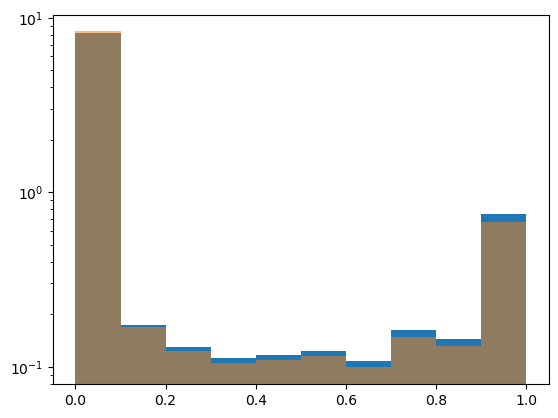

In [170]:
nonmass = np.logical_and(np.abs(ds["qctend_TAU"] + ds["qrtend_TAU"]) > 0, ds["qctend_TAU"] < 0)
negtend = ds["qctend_TAU"] < 0
plt.hist(ds["FREQR"].values[nonmass], density=True)
plt.hist(ds["FREQR"].values[negtend], alpha=0.5, density=True)
plt.gca().set_yscale("log")

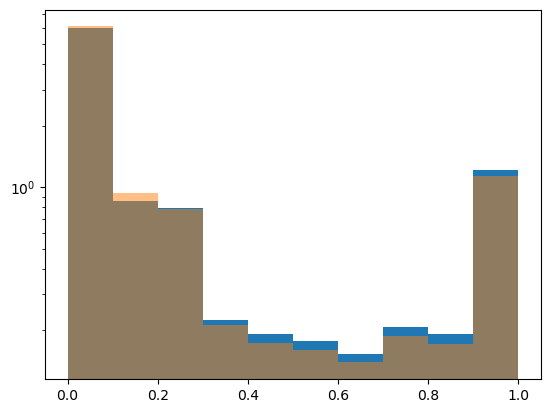

In [171]:
plt.hist(ds["CLOUD"].values[nonmass], density=True)
plt.hist(ds["CLOUD"].values[negtend], alpha=0.5, density=True)
plt.gca().set_yscale("log")

In [172]:
np.abs(ds["qctend_TAU"] + ds["qrtend_TAU"]).max()

<xarray.DataArray ()>
array(6.77626358e-21)

In [199]:
cloud_tends = ds["qctend_TAU"].values[np.logical_and(ds["FREQR"].values == 0, 
                                              ds["qctend_TAU"].values < 0)]
cloud_tends.max()

-3.2098832406453933e-37

In [188]:
ds["CLOUD"].shape

(32, 32, 192, 288)

In [189]:
ds["qctend_TAU"].shape

(32, 32, 192, 288)

In [203]:
np.count_nonzero(np.logical_and(ds["QC_TAU_in"] >= 1e-6, ds["CLOUD"] == 0))

151625257

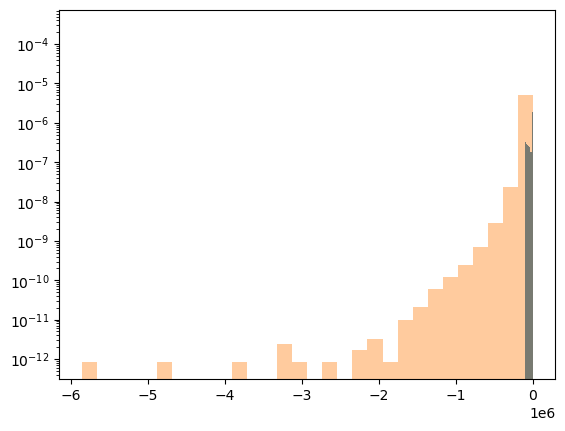

In [322]:
plt.hist(ds["nctend_TAU"].values[np.logical_and(ds["CLOUD"] == 0, ds["QC_TAU_in"].values >= 1e-6)], bins=30, density=True)
plt.hist(ds["nctend_TAU"].values[np.logical_and(ds["CLOUD"] > 1e-4, ds["QC_TAU_in"].values >= 1e-6)], bins=30, density=True, alpha=0.4)

plt.gca().set_yscale("log")

In [364]:
np.count_nonzero((ds["nctend_TAU"].values == 0) & (ds["CLOUD"].values > 0) & (ds["FREQR"].values > 0)) / np.count_nonzero(ds["nctend_TAU"].values == 0)

0.006213680576700855

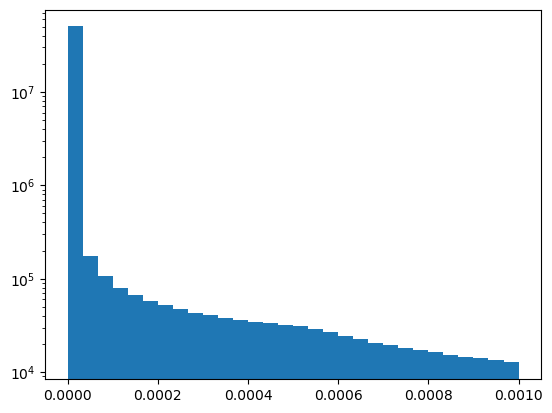

In [226]:
plt.hist(ds["QR_TAU_in"].values[ds["FREQR"].values == 1], bins=30)
plt.gca().set_yscale("log")

In [263]:
np.count_nonzero(np.logical_and(ds["FREQR"].values == 0, ds["CLOUD"].values == 1)) 

183904